In [1]:
import h5py
# filename = "/home/david/Documents/TUM/Summer2023/thesis/Training_software/T1_default_27-07-2022_21-05-01.h5"
import os

directory = ("/home/david/Documents/thesis/data/Training_software/")

T1_data_all = []
T2_data_all = []
T2_star_data_all =[]
for file in os.listdir(directory):
   filename = os.fsdecode(file)
   if filename.endswith(".py") or  filename.endswith(".pyc"): 
      continue
   else:
      fname_hold = filename 
      filename = "/home/david/Documents/thesis/data/Training_software/" + filename 
      with h5py.File(filename, "r") as f:
         a_group_key = list(f.keys())[0]
         data = list(f[a_group_key])
         data = list(f[a_group_key])
         ds_obj = f[a_group_key]      
         ds_arr = f[a_group_key][()]  
         if fname_hold[0:2] == "T1":
            T1_data_all.append(ds_arr)
         elif fname_hold[0:7] == "T2_star": 
            T2_star_data_all.append(ds_arr)
         else:
            T2_data_all.append(ds_arr)


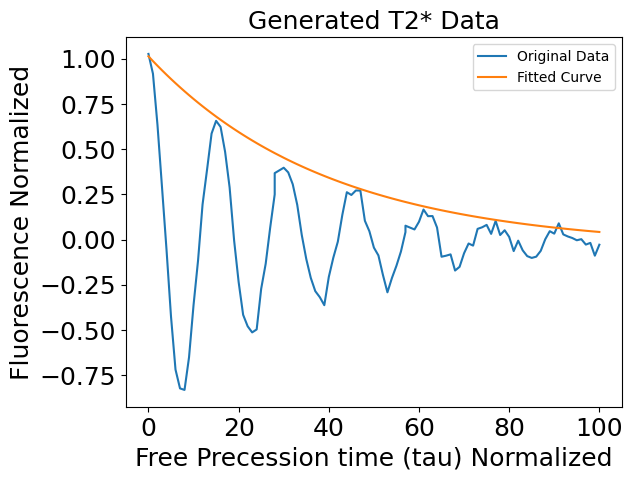

In [9]:
import matplotlib.pyplot as plt
import numpy as np
from Random_exp_data import genereate_T2star_data
from expon_decay import fit_T2_star 
import statistics

t2_star_out = []
for i in range(200):
    x_data, T2_star_data = genereate_T2star_data()
    out = fit_T2_star((np.asarray(x_data)*100).astype(int), np.asarray(T2_star_data))
    plt.plot((np.asarray(x_data)*100).astype(int), np.asarray(T2_star_data), label='Original Data')
    plt.plot((np.asarray(x_data)*100).astype(int), out[-1], label='Fitted Curve')
    t2_star_out.append(fit_T2_star((np.asarray(x_data)*100).astype(int), np.asarray(T2_star_data)))
    plt.title('Generated T2* Data', fontsize = 18)
    plt.xlabel('Free Precession time (tau) Normalized', fontsize = 18)
    plt.ylabel('Fluorescence Normalized', fontsize = 18)
    # 
    plt.xticks(fontsize=18)
    plt.yticks(fontsize=18)
    plt.legend()
    plt.show()
    
    break

In [ ]:
t2_star_outr2s = [t[0] for t in t2_star_out]
average = statistics.mean(t2_star_outr2s)
print(average)

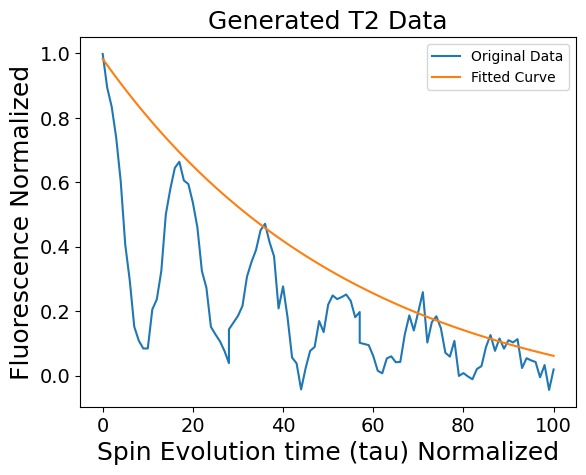

In [13]:
import numpy as np
import random as rdm
from Random_exp_data import genereate_T2_data
from expon_decay import fit_T2 
import statistics

t2_out = []
for i in range(200):
    x_data, T2_data = genereate_T2_data()
    out = fit_T2((np.asarray(x_data)*100).astype(int), np.asarray(T2_data))
    plt.plot((np.asarray(x_data)*100).astype(int), np.asarray(T2_data),  label='Original Data')
    plt.plot((np.asarray(x_data)*100).astype(int),out[-1] , label='Fitted Curve')
    plt.title('Generated T2 Data', fontsize = 18)
    plt.xlabel('Spin Evolution time (tau) Normalized', fontsize = 18)
    plt.ylabel('Fluorescence Normalized', fontsize = 18)
    t2_out.append(out)
    # 
    plt.xticks(fontsize=14)
    plt.yticks(fontsize=14)
    plt.legend()
    plt.show()
    
    break


In [5]:
t2_outr2s = [t[0] for t in t2_out]
average = statistics.mean(t2_outr2s)
print(average)

0.9873909270158866


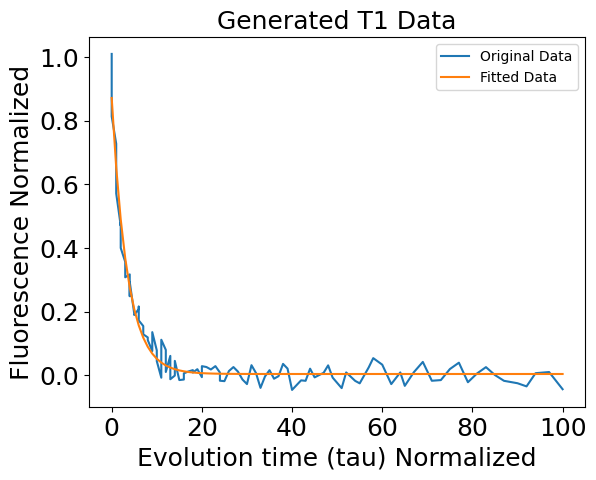

In [15]:
import numpy as np
import random as rdm
from Random_exp_data import genereate_T1_data
from expon_decay import fit_T1 
import statistics
import matplotlib.pyplot as plt


t1_out = []
for i in range(200):
    x_data, T1_data = genereate_T1_data()
    out = fit_T1((np.asarray(x_data)*100).astype(int), np.asarray(T1_data))
    plt.plot((np.asarray(x_data)*100).astype(int), np.asarray(T1_data), label='Original Data')
    plt.plot((np.asarray(x_data)*100).astype(int),out[-1] , label='Fitted Data')
    plt.title('Generated T1 Data',fontsize = 18 )
    plt.xlabel('Evolution time (tau) Normalized', fontsize = 18)
    plt.ylabel('Fluorescence Normalized', fontsize = 18)
    plt.legend()
    t1_out.append(out)
    plt.xticks(fontsize=18)
    plt.yticks(fontsize=18)
    plt.show()
    

    
    break


# As we have seen we can fit the generate data quite well. Now we need to fit the non-generate data

In [8]:
t1_r2s = [t[0] for t in t1_out]
average = statistics.mean(t1_r2s)
print(average)

0.9825754370419687


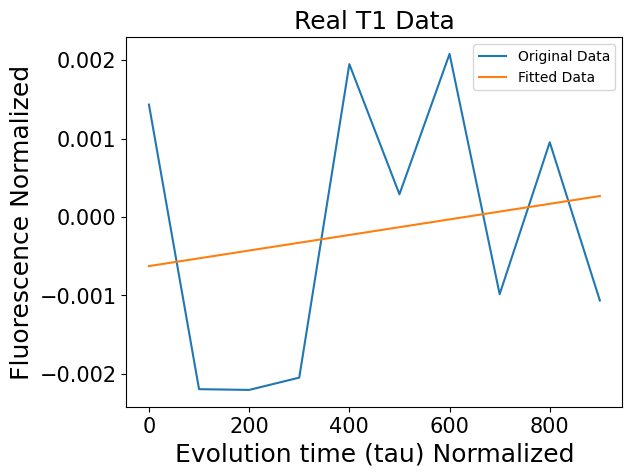

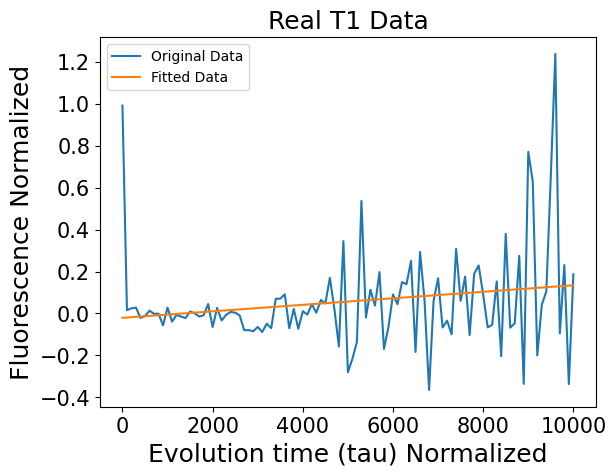

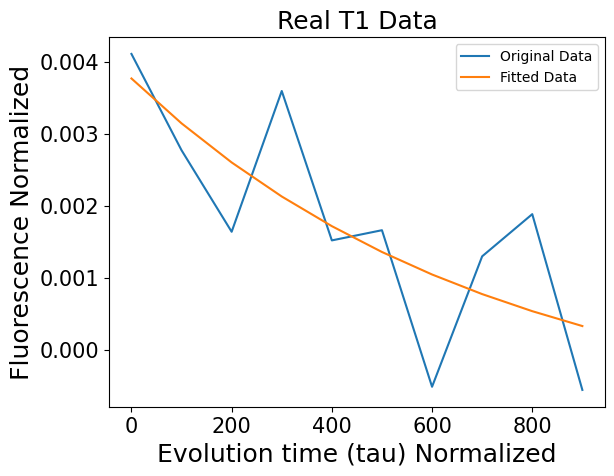

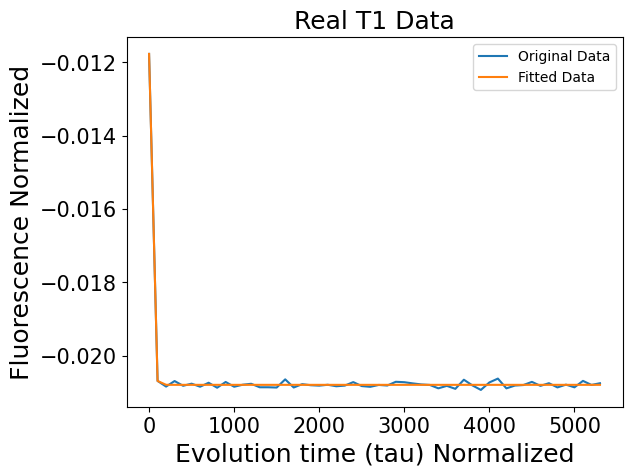

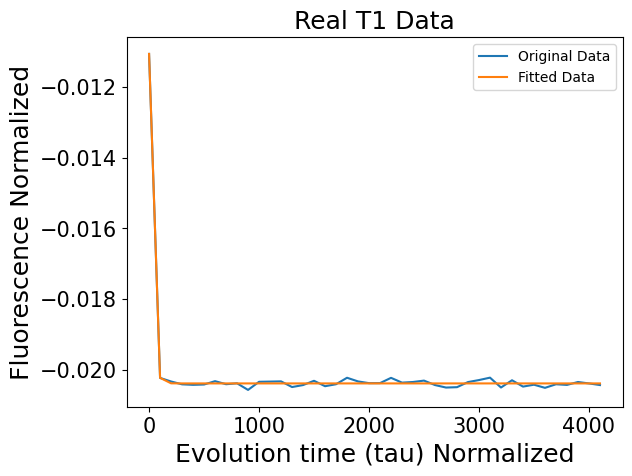

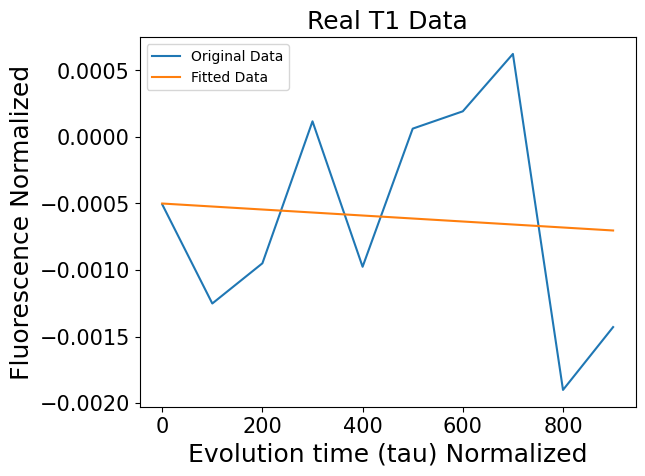

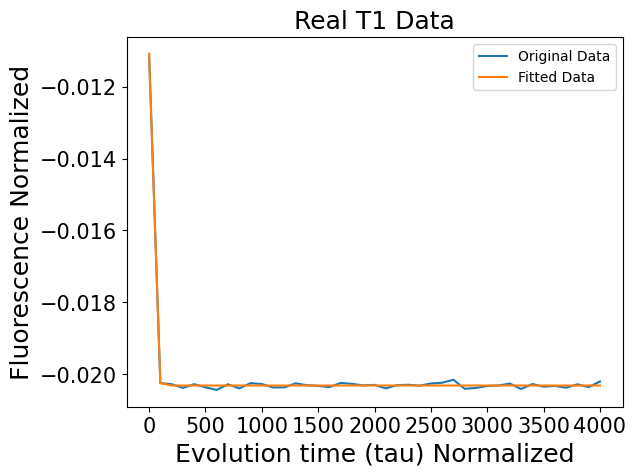

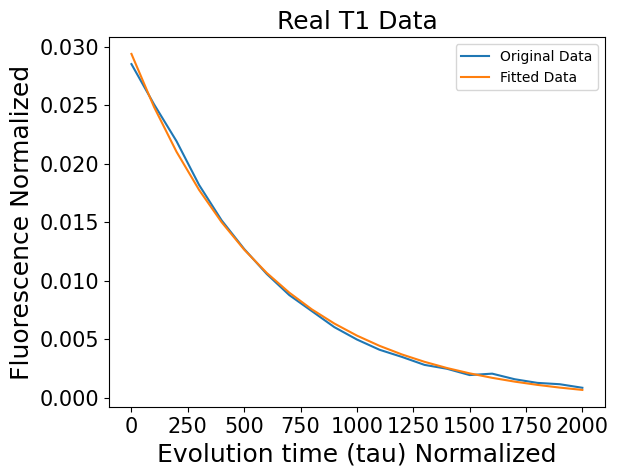

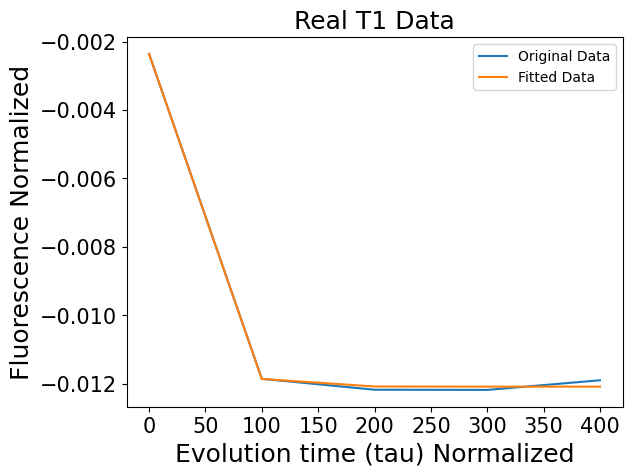

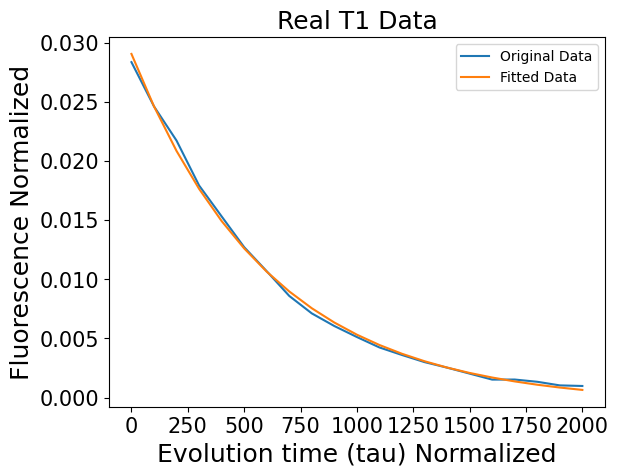

/home/david/.local/lib/python3.8/site-packages/scipy/optimize/_minpack_py.py:906: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


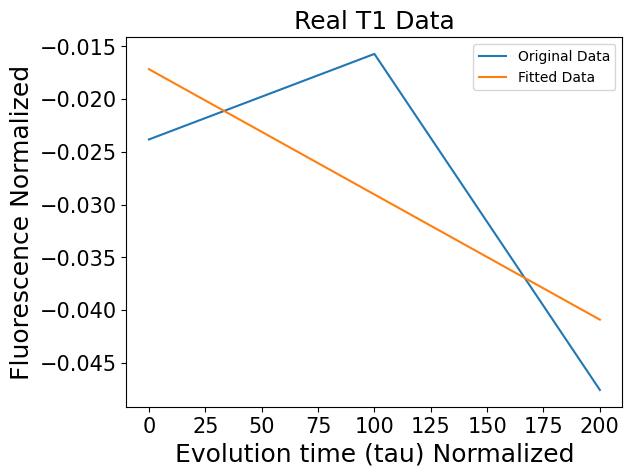

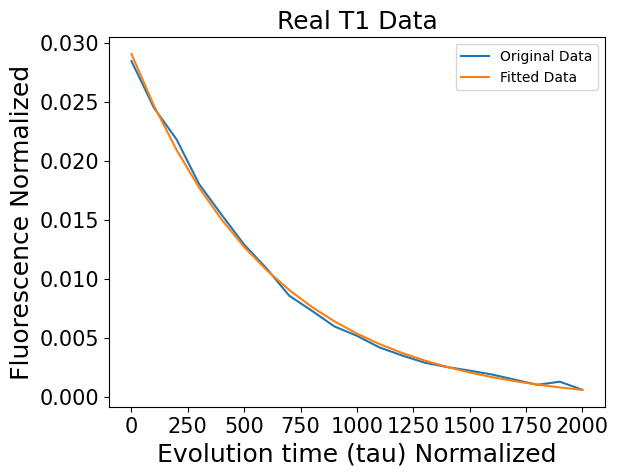

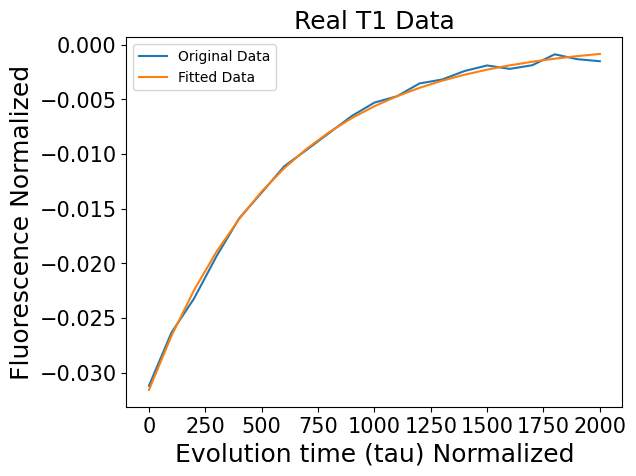

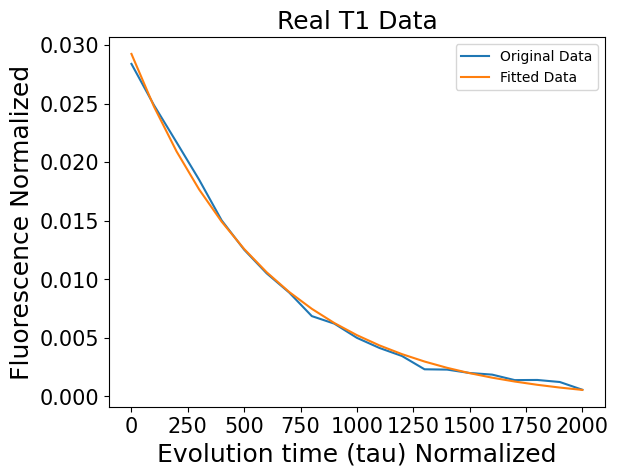

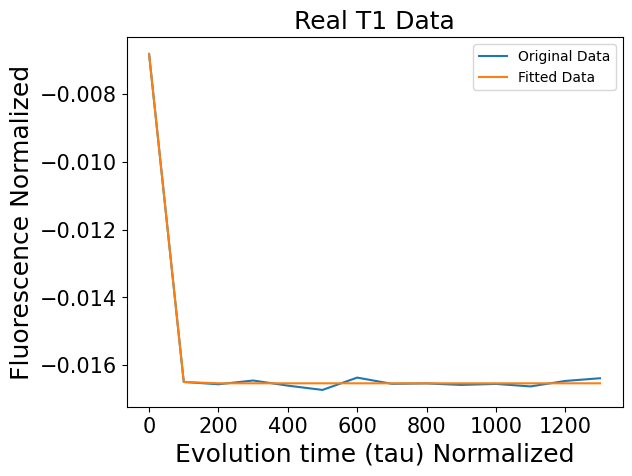

...

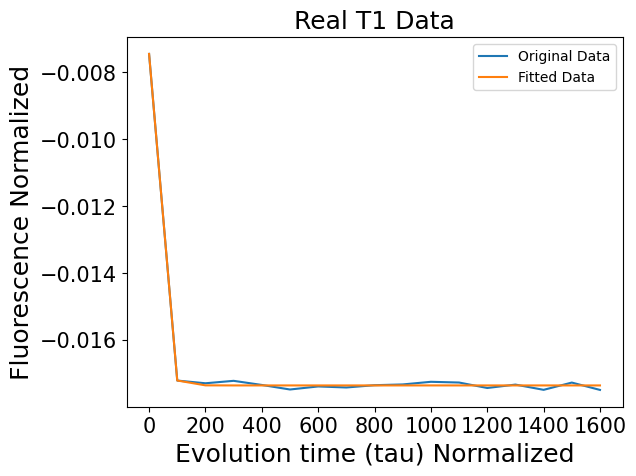

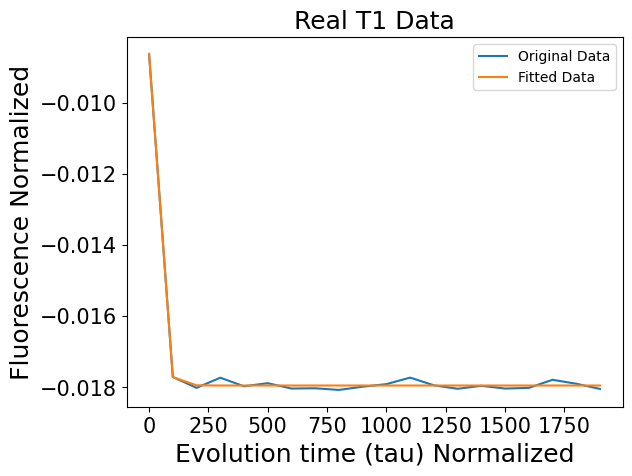

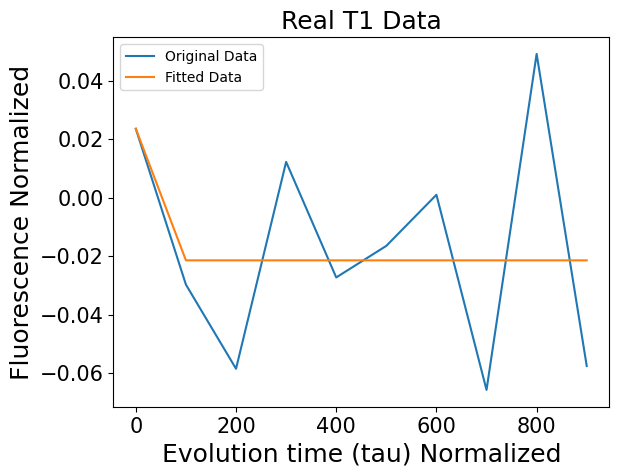

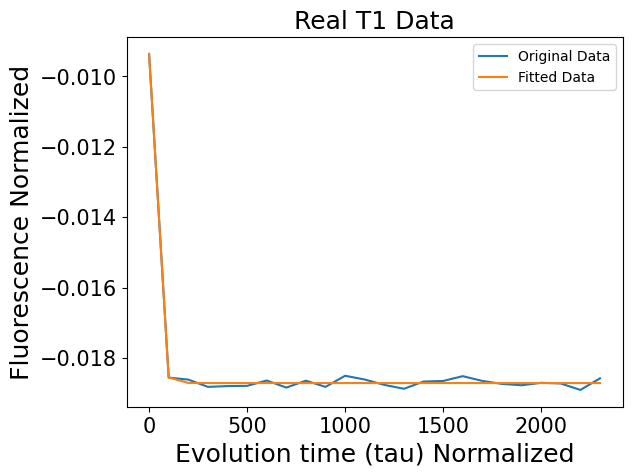

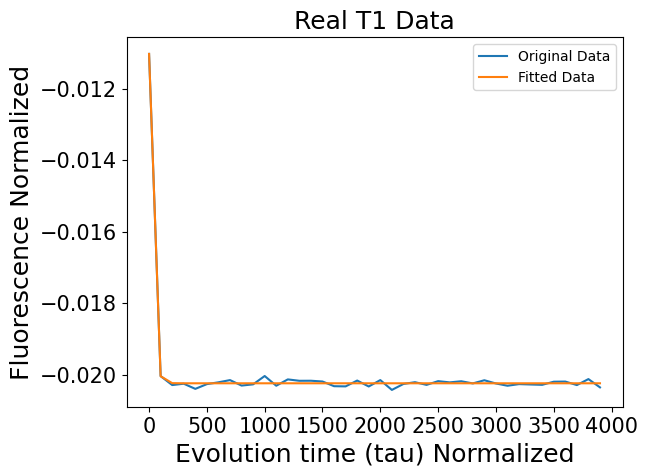

0.7038587316886592


In [16]:
import numpy as np
import random as rdm
from Random_exp_data import genereate_T1_data
from expon_decay import fit_T1 
import statistics
import matplotlib.pyplot as plt


t1_out = []
for i in range(len(T1_data_all)):
    ys = np.asarray((T1_data_all[i][:, 0] - T1_data_all[i][:, 1]) / (T1_data_all[i][:, 0] + T1_data_all[i][:, 1]))
    ti = np.arange(len(ys))
    if len(ti) >= 3: 
        out = fit_T1(ti, ys)
        if isinstance(out, tuple):
            t1_out.append(out)
            plt.plot((np.asarray(ti)*100).astype(int), np.asarray(ys), label='Original Data')
            plt.plot((np.asarray(ti)*100).astype(int),out[-1] , label='Fitted Data')
            
            plt.title('Real T1 Data',fontsize = 18 )
            plt.xlabel('Evolution time (tau) Normalized', fontsize = 18)
            plt.ylabel('Fluorescence Normalized', fontsize = 18)
            plt.legend()
            t1_out.append(out)
            plt.xticks(fontsize=15)
            plt.yticks(fontsize=15)
            plt.show()

        else:
            t1_out.append((-1, 0, 0, 0))
    else: 
        t1_out.append((-1, 0, 0, 0))

# creat a different filter ... perhaps None
r2s = [num[0] for num in t1_out if num[0] != -1]
average = statistics.mean(r2s)
print(average)

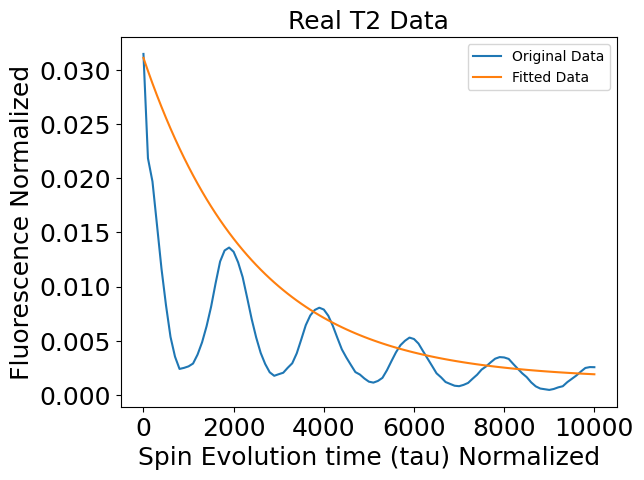

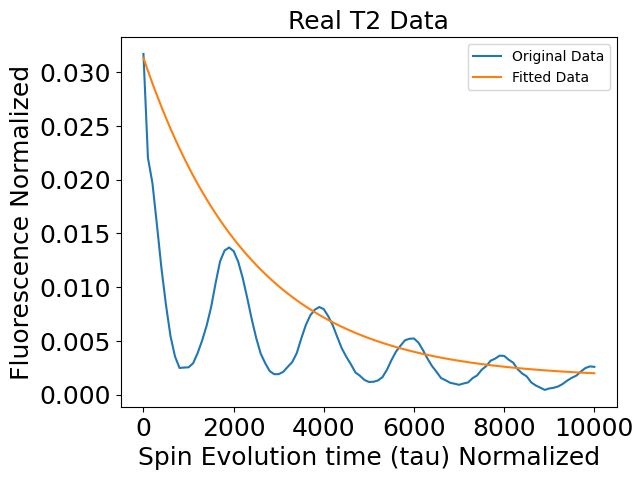

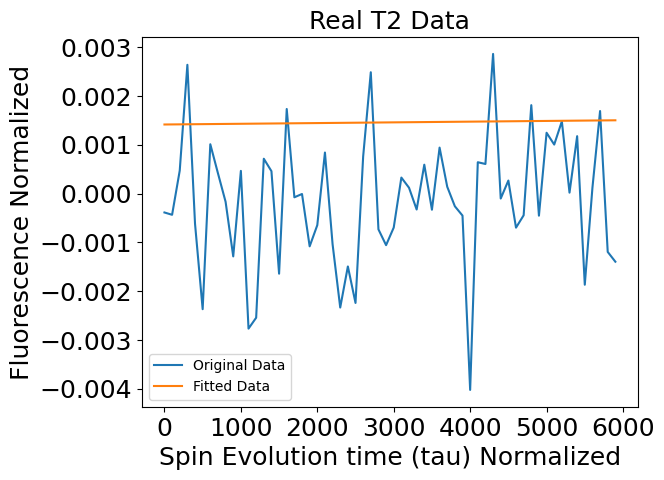

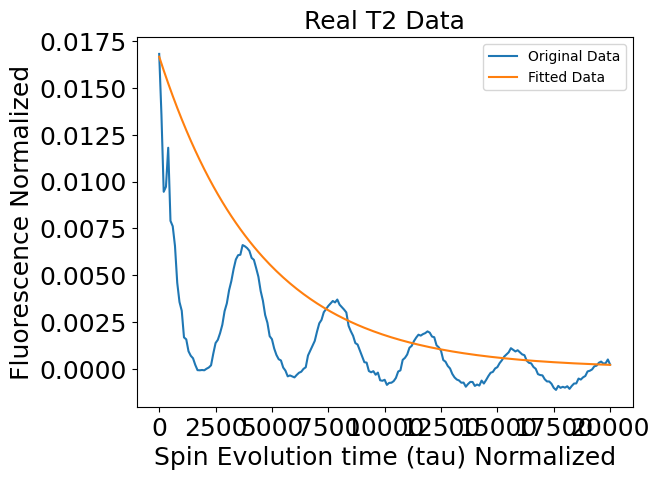

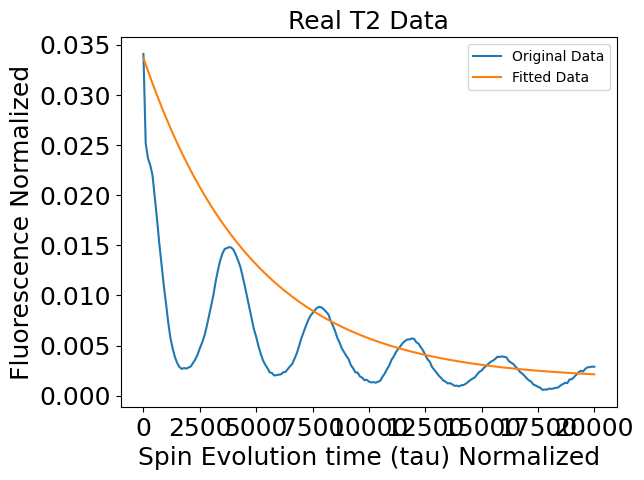

...

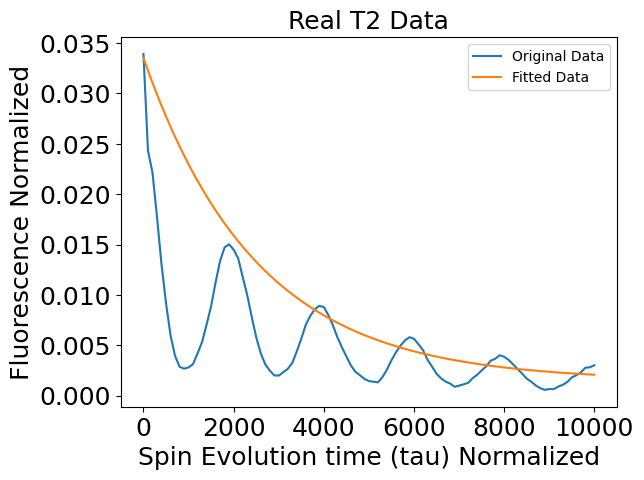

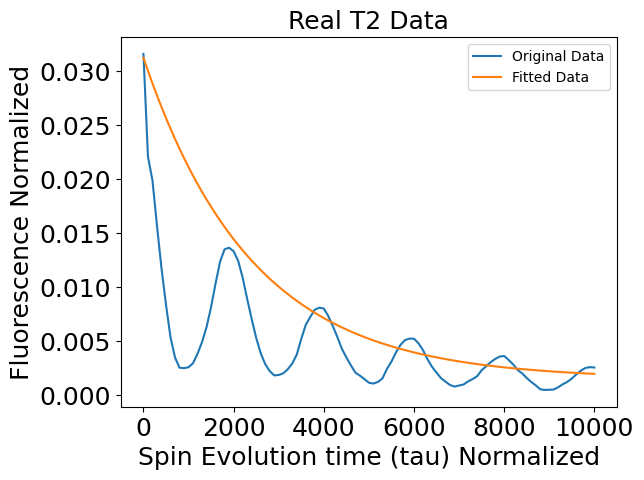

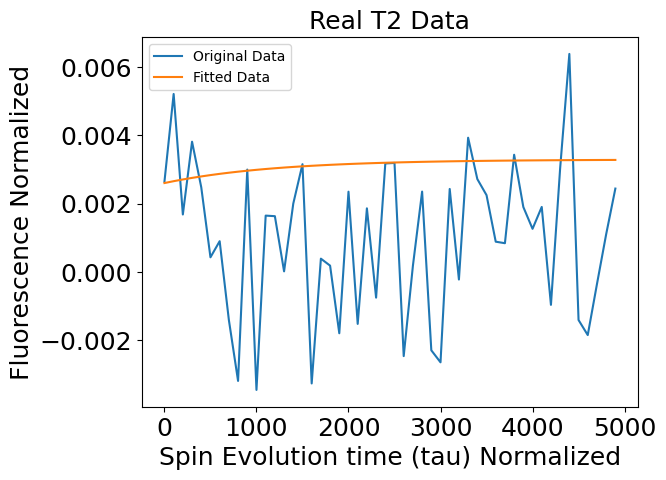

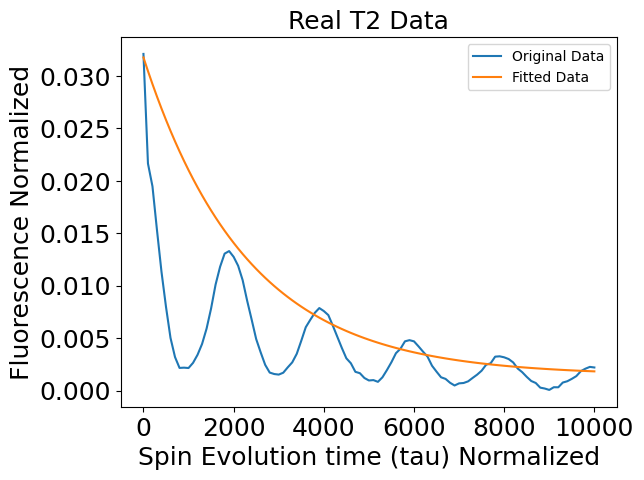

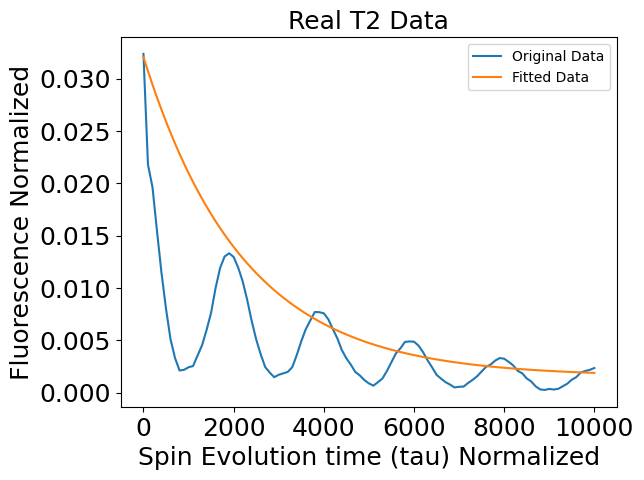

0.6437505579750429


In [17]:
import numpy as np
import random as rdm
from Random_exp_data import genereate_T2_data
from expon_decay import fit_T2 
import statistics

t2_out = []
for i in range(len(T2_data_all)):
    ys = np.asarray((T2_data_all[i][:, 0] - T2_data_all[i][:, 1]) / (T2_data_all[i][:, 0] + T2_data_all[i][:, 1]))
    ti = np.arange(len(ys))
    if len(ti) >= 3: 
        out = fit_T2(ti, ys)
        if isinstance(out, tuple):
            t2_out.append(out)
            plt.plot((np.asarray(ti)*100).astype(int), np.asarray(ys), label='Original Data')
            plt.plot((np.asarray(ti)*100).astype(int),out[-1] , label='Fitted Data')
            plt.title('Real T2 Data', fontsize = 18)
            plt.xlabel('Spin Evolution time (tau) Normalized', fontsize = 18)
            plt.ylabel('Fluorescence Normalized', fontsize = 18)
            t2_out.append(out)
            # 
            plt.xticks(fontsize=18)
            plt.yticks(fontsize=18)
            plt.legend()
            plt.show()
        else:
            t2_out.append((-1, 0, 0, 0))
    else: 
        t2_out.append((-1, 0, 0, 0))
    
r2s = [num[0] for num in t2_out if num[0] != -1]
average = statistics.mean(r2s)
print(average)

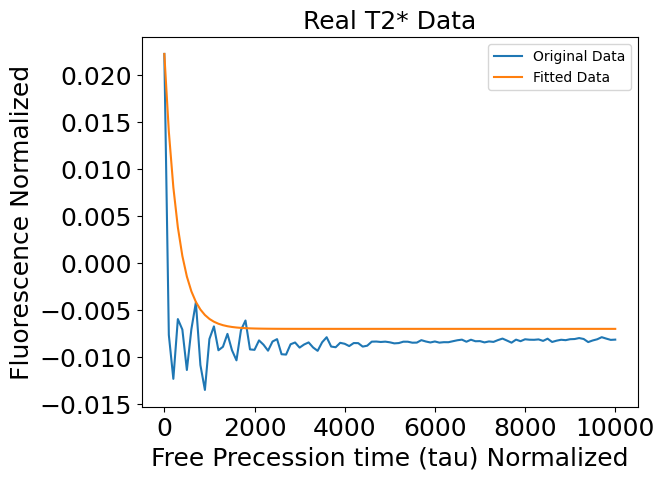

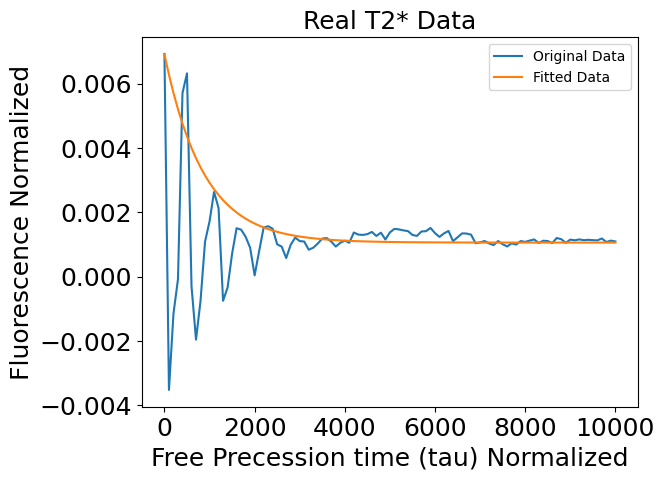

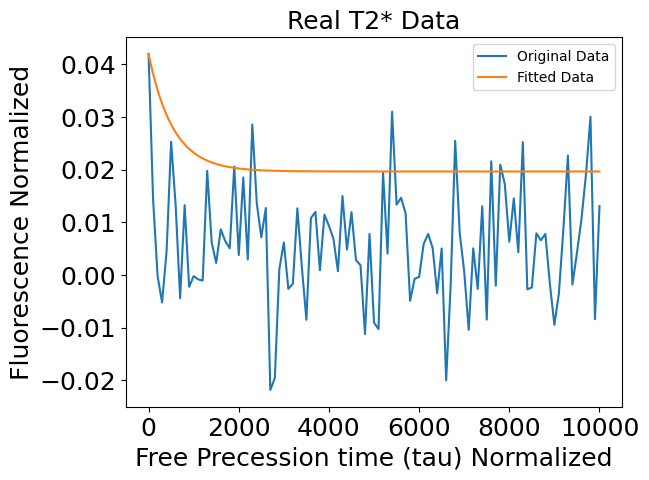

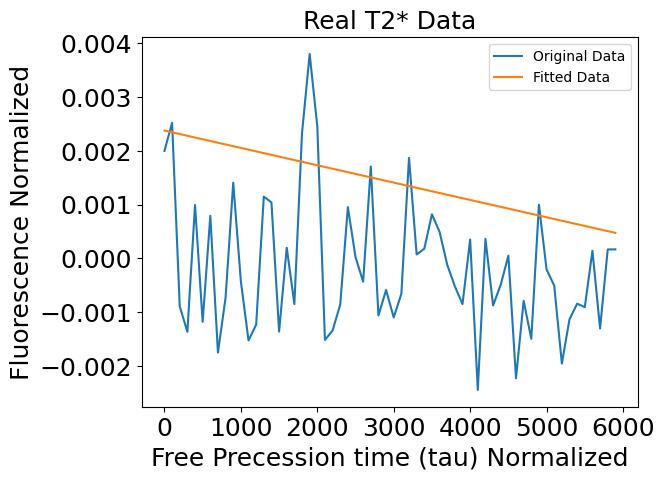

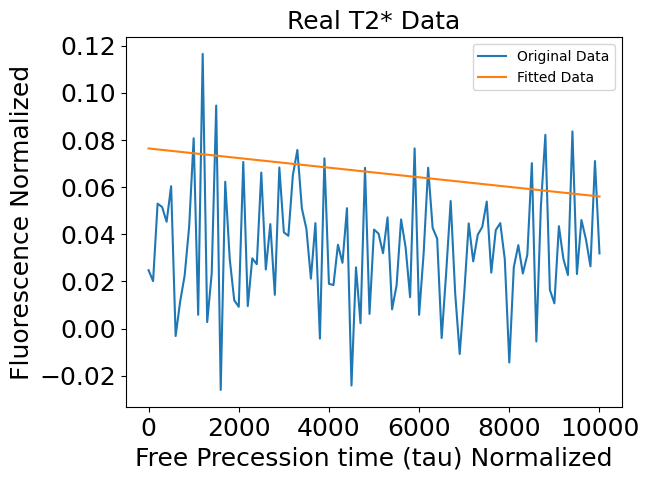

...

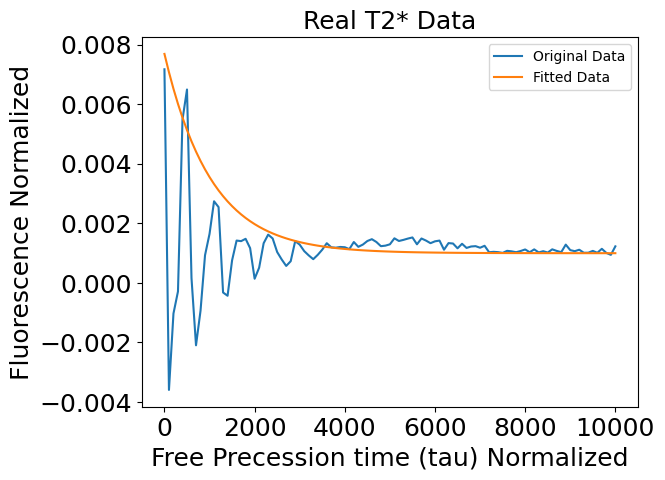

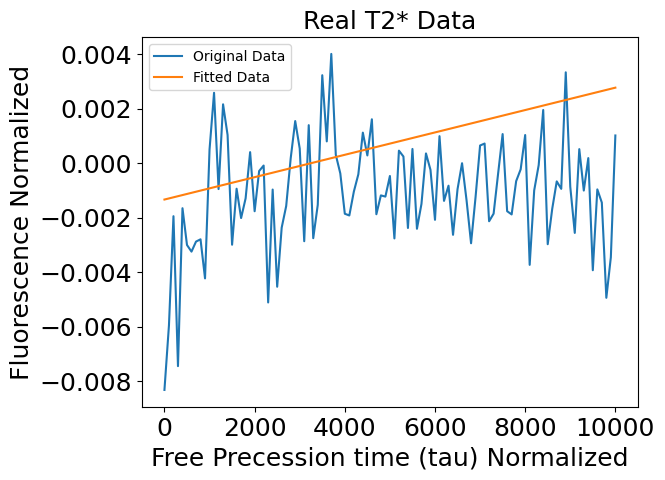

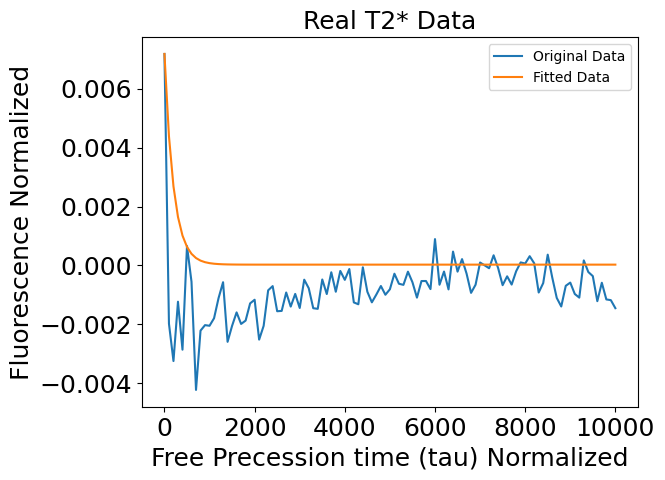

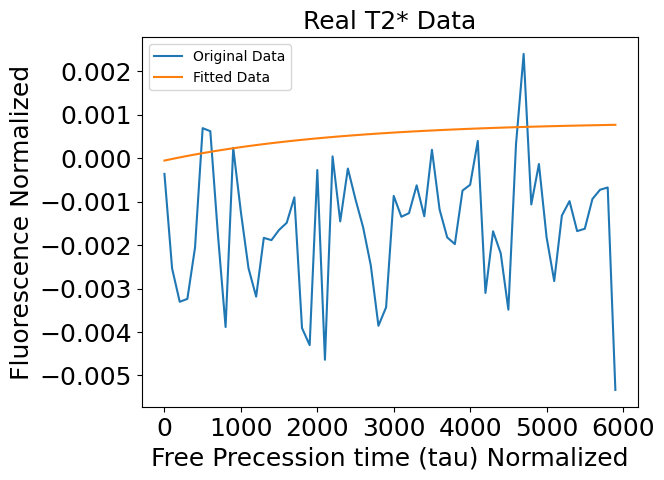

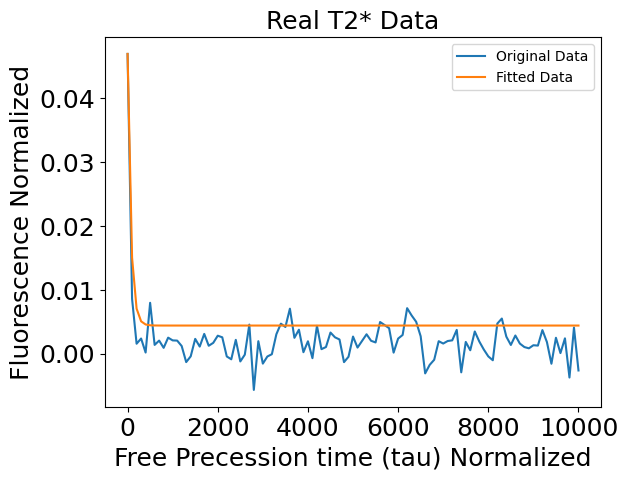

KeyboardInterrupt: 

In [18]:
import numpy as np
import random as rdm
from Random_exp_data import genereate_T2_data
from expon_decay import fit_T2 
import statistics

t2__star_out = []
for i in range(len(T2_star_data_all)):
    ys = np.asarray((T2_star_data_all[i][:, 0] - T2_star_data_all[i][:, 1]) / (T2_star_data_all[i][:, 0] + T2_star_data_all[i][:, 1]))
    ti = np.arange(len(ys))
    if len(ti) >= 3: 
        out = fit_T2(ti, ys)
        if isinstance(out, tuple):
            t2__star_out.append(out)
            plt.plot((np.asarray(ti)*100).astype(int), np.asarray(ys), label='Original Data')
            plt.plot((np.asarray(ti)*100).astype(int),out[-1] , label='Fitted Data')
            plt.title('Real T2* Data', fontsize = 18)
            plt.xlabel('Free Precession time (tau) Normalized', fontsize = 18)
            plt.ylabel('Fluorescence Normalized', fontsize = 18)
            # 
            plt.xticks(fontsize=18)
            plt.yticks(fontsize=18)
            plt.legend()
            plt.show()
        else:
            t2__star_out.append((-1, 0, 0, 0))
    else: 
        t2__star_out.append((-1, 0, 0, 0))
    
r2s = [num[0] for num in t2__star_out if num[0] != -1]
average = statistics.mean(r2s)
print(average)

In [8]:
len(T2_star_data_all)

87

In [ ]:
# quick test to see which noise level in generate data actually causes substantial r2 drop off 

In [ ]:
import numpy as np
import random as rdm
from Random_exp_data import genereate_T2star_data
from expon_decay import fit_T2_star 
import statistics
import matplotlib.pyplot as plt

t2_star_out = []
for i in range(len(T2_data_all)):
    ys = np.asarray((T2_data_all[i][:, 0] - T2_data_all[i][:, 1]) / (T2_data_all[i][:, 0] + T2_data_all[i][:, 1]))
    ti = np.arange(len(ys))
    if len(ti) >= 3: 
        out = fit_T2_star(ti, ys)
        if isinstance(out, tuple):
            t2_star_out.append(out)
        else:
            t2_star_out.append((-1, 0, 0, 0))
    else: 
        t2_star_out.append((-1, 0, 0, 0))
    
r2s = [num[0] for num in t2_star_out if num[0] != -1]
average = statistics.mean(r2s)
print(average)

# Here below we want to split the R2 of the t2 since we do not know if it doing t2star or t2. 

In [ ]:
likely_t2star = []
for i in range(len(t2_star_out)):
    if t2_star_out[i][0] > t2_out[i][0]:
        likely_t2star.append(t2_star_out[i])
r2s = [num[0] for num in likely_t2star if num[0] != -1]
average = statistics.mean(r2s)
print(average)

In [ ]:
likely_t2 = []
for i in range(len(t2_out)):
    if t2_star_out[i][0] < t2_out[i][0]:
        likely_t2.append(t2_out[i])

r2s = [num[0] for num in likely_t2 if num[0] != -1]
average = statistics.mean(r2s)
print(average)

# Lets see how much vairation in noise actuall affects the r2

intially will run for 200 samples each of the t1, t2, t2* for a given level of noise
collect the avg r2
and plot that each agianst noise level

In [32]:
import numpy as np
import random as rdm
from Random_exp_data import genereate_T1_data, genereate_T2star_data, genereate_T2_data
from expon_decay import fit_T1, fit_T2_star , fit_T2
import statistics
import matplotlib.pyplot as plt

noise_levels = np.linspace(0.03, 1.0, 50)
average_t2_star = []
average_t2 = []
average_t1 = []
from tqdm import tqdm

for nl in tqdm(noise_levels): 
    t2_star_out = []
    t2_out = []
    t1_out = []
    for i in range(200):
        x_data, T2_star_data = genereate_T2star_data(noise_lvl= nl)
        t2_star_out.append(fit_T2_star((np.asarray(x_data)*100).astype(int), np.asarray(T2_star_data)))
        x_data, T2_data = genereate_T2_data(noise_lvl= nl)
        t2_out.append(fit_T2((np.asarray(x_data)*100).astype(int), np.asarray(T2_data)))
        x_data, T1_data = genereate_T1_data(noise_lvl= nl)
        t1_out.append(fit_T1((np.asarray(x_data)*100).astype(int), np.asarray(T1_data)))
    r2s = [t[0] for t in t2_star_out if t != 0]
    average_t2_star.append(statistics.mean(r2s))
    r2s = [t[0] for t in t2_out if t != 0]
    average_t2.append(statistics.mean(r2s))
    r2s = [t[0] for t in t1_out if t != 0]
    average_t1.append(statistics.mean(r2s))

100%|██████████| 50/50 [01:10<00:00,  1.41s/it]


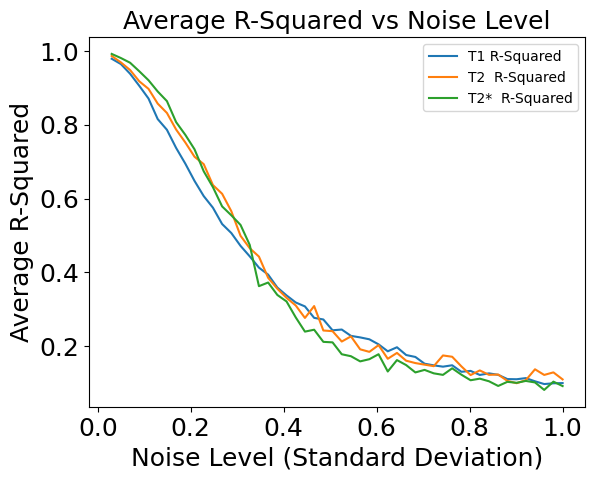

In [36]:
plt.plot(noise_levels, average_t1, label='T1 R-Squared')
plt.plot(noise_levels, average_t2, label='T2  R-Squared')
plt.plot(noise_levels, average_t2_star, label='T2*  R-Squared')
# Adding vertical lines at y=95
index = None
for i, value in enumerate(average_t1):
    if value >= 0.95:
        index = i
        break

plt.title("Average R-Squared vs Noise Level", fontsize = 18)
plt.xlabel('Noise Level (Standard Deviation)', fontsize = 18)
plt.ylabel('Average R-Squared', fontsize = 18)
plt.xticks(fontsize=18)
plt.yticks(fontsize=18)
plt.legend()
plt.show()

# want to narrow the experiement

In [37]:
import numpy as np
import random as rdm
from Random_exp_data import genereate_T1_data
from expon_decay import fit_T1 
import statistics
import matplotlib.pyplot as plt

noise_levels = np.linspace(0.03, .1, 50)
average_t2_star = []
average_t2 = []
average_t1 = []
from tqdm import tqdm

for nl in tqdm(noise_levels): 
    t2_star_out = []
    t2_out = []
    t1_out = []
    for i in range(200):
        x_data, T2_star_data = genereate_T2star_data(noise_lvl= nl)
        t2_star_out.append(fit_T2_star((np.asarray(x_data)*100).astype(int), np.asarray(T2_star_data)))
        x_data, T2_data = genereate_T2_data(noise_lvl= nl)
        t2_out.append(fit_T2((np.asarray(x_data)*100).astype(int), np.asarray(T2_data)))
        x_data, T1_data = genereate_T1_data(noise_lvl= nl)
        t1_out.append(fit_T1((np.asarray(x_data)*100).astype(int), np.asarray(T1_data)))
    r2s = [t[0] for t in t2_star_out if t != 0]
    average_t2_star.append(statistics.mean(r2s))
    r2s = [t[0] for t in t2_out if t != 0]
    average_t2.append(statistics.mean(r2s))
    r2s = [t[0] for t in t1_out if t != 0]
    average_t1.append(statistics.mean(r2s))


  0%|          | 0/50 [00:00<?, ?it/s]/home/david/.local/lib/python3.8/site-packages/scipy/optimize/_minpack_py.py:906: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',
100%|██████████| 50/50 [00:20<00:00,  2.45it/s]


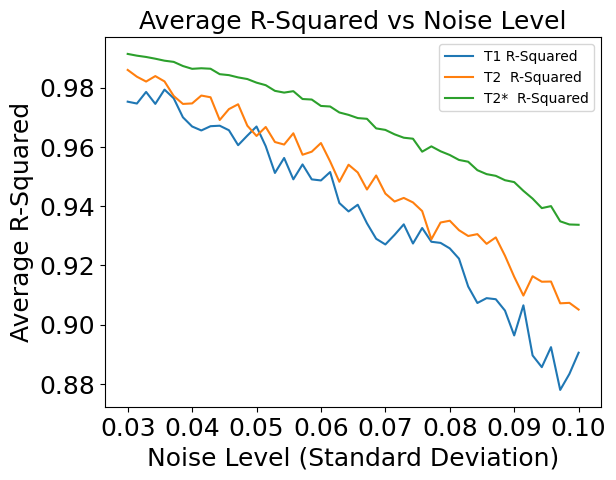

In [38]:
plt.plot(noise_levels, average_t1, label='T1 R-Squared')
plt.plot(noise_levels, average_t2, label='T2  R-Squared')
plt.plot(noise_levels, average_t2_star, label='T2*  R-Squared')
# Adding vertical lines at y=95
index = None
for i, value in enumerate(average_t1):
    if value >= 0.95:
        index = i
        break

plt.title("Average R-Squared vs Noise Level", fontsize = 18)
plt.xlabel('Noise Level (Standard Deviation)', fontsize = 18)
plt.ylabel('Average R-Squared', fontsize = 18)
plt.xticks(fontsize=18)
plt.yticks(fontsize=18)
plt.legend()
plt.show()

t1 is decreasing more rapidly because it simply has to balance more pounts than the other r2s. 